# **Integrasi ControlNet dengan Stable Diffusion Menggunakan Canny Edge Algorithm dan Open Pose (1)**

ControlNet: Sebuah pendekatan atau metodologi dalam jaringan saraf tiruan (neural networks) yang digunakan untuk memanipulasi dan mengontrol output dari model generatif. Ini berarti ControlNet memberikan kemampuan kepada pengguna untuk memberikan petunjuk atau kontrol yang lebih spesifik terhadap hasil yang diinginkan dari sebuah model machine learning.


---


Pada notebook ini, akan menggambarkan project bersifat materi tentang penggabungan metode `ControlNet` dan `Stable Diffusion` dalam satu framework machine learning yang populer yaitu `PyTorch`. Dengan memanfaatkan kemampuan ControlNet dalam mengontrol aspek spesifik dari gambar yang dihasilkan, proyek ini mendorong batas-batas dalam generasi gambar yang dikendalikan. Integrasi ControlNet dan Stable Diffusion ini akan coder perkaya dengan penerapan Canny Edge Algorithm untuk deteksi tepi yang efektif dan Open Pose untuk analisis pose yang akurat.


Tujuan utama dari isi notebook ini adalah menciptakan sebuah sistem machine learning yang mampu menghasilkan gambar realistis dengan kontrol yang lebih baik terhadap komposisi dan dinamika dalam gambar.


---


**Note:** Pada notebook `Stable_Diffusion_ControlNet_(1).ipynb` ini akan spesifik pada algoritma Canny Edge. Dan untuk Open Pose akan ada file notebook terpisah yang diberi nama `Stable_Diffusion_ControlNet_(2).ipynb`.


### Additional resources and info about the technique

- Merujuk pada paper [Adding Conditional Control to Text-to-Image Diffusion Models](https://arxiv.org/abs/2302.05543) yang dipublikasikan Februari 2023
- ControlNet dikembangkan dari gagasan bahwa hanya teks saja tidak cukup untuk menyelesaikan semua masalah dalam pembuatan gambar.
* Versi pertama: https://github.com/lllyasviel/ControlNet#below-is-controlnet-10
* Diagram dan penjelasan tambahan: https://github.com/lllyasviel/ControlNet#stable-diffusion--controlnet

### **ControlNet versi 1.0**

![Image](https://raw.githubusercontent.com/lllyasviel/ControlNet/main/github_page/he.png)

Gambar diatas mengilustrasikan bagaimana menerapkan ControlNet pada blok neural network apa pun.

- `x` dan `y` mewakili fitur dalam yang ada dalam neural network. Ini adalah representasi kompleks yang dipelajari jaringan dari input data.

- Simbol `+` mengacu pada penambahan fitur, yang merupakan cara menggabungkan informasi dari fitur yang berbeda.

- `c` mewakili kondisi tambahan yang ditambahkan ke neural network. Ini bisa berupa informasi tambahan yang ingin dipertimbangkan oleh network saat membuat prediksinya.

Secara sederhana, gambar ini menunjukkan bagaimana fitur-fitur dalam (`x` dan `y`) dari sebuah jaringan saraf dikombinasikan (melalui penambahan fitur), dan kemudian bagaimana sebuah kondisi tambahan (`c`) diterapkan untuk mempengaruhi hasil akhir dari proses ini. Proses ini membantu dalam mengarahkan jaringan saraf untuk menghasilkan output yang lebih sesuai dengan kondisi tambahan yang diberikan.




---


Dalam penerapan ControlNet, ada berbagai teknik yang dapat digunakan. Namun, sesuai yang dipaparkan di awal notebook, untuk sekadar project materi, akan fokus pada dua metode spesifik:

1. **Edge Detection using Canny Edge**
  
  Teknik ini melibatkan identifikasi batas objek dalam sebuah gambar. Metode Deteksi Canny merupakan algoritma populer yang digunakan untuk mendeteksi berbagai jenis tepi dalam gambar. Metode ini digunakan untuk membantu model memahami bentuk-bentuk yang ada dalam input.

2. **Pose Estimation using Open Pose**

  Teknik ini berkaitan dengan pemahaman pose seseorang dalam gambar atau video. Open Pose adalah sebuah perpustakaan yang memungkinkan deteksi titik kunci multi-orang secara real-time. Ini dapat mengidentifikasi di mana orang berada dan bagaimana pose mereka dalam gambar atau video. Informasi ini dapat digunakan untuk mengkondisikan model agar memahami dan belajar dari pose yang ada dalam input.

## **Hands-On Coding: Installing all libraries needed**

In [ ]:
!pip install diffusers==0.14                                                      #menginstal paket Python bernama 'diffusers' versi 0.14 menggunakan pip
!pip install -q accelerate transformers xformers                                  #menginstal tiga paket Python sekaligus: 'accelerate', 'transformers', dan 'xformers'.
                                                                                  #Opsi '-q' berarti 'quiet', yang berarti pip tidak akan mencetak pesan output yang biasanya ditampilkan saat menginstal paket.

In [ ]:
!pip install -q opencv-contrib-python                                           #Salah satu pustaka/library untuk task computer vision, termasuk deteksi tepi menggunakan algoritme Canny Edge
!pip install -q controlnet_aux                                                  #Salah satu pustaka/library yang berisi fungsi tambahan untuk model ControlNet.

In [3]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel
import torch #using PyTorch in this project
import cv2
from PIL import Image
import numpy as np

In [4]:
# Function show image as grid
# Fungsi ini menerima empat argumen:
# imgs: daftar gambar yang akan ditampilkan dalam grid
# rows: jumlah baris dalam grid
# cols: jumlah kolom dalam grid
# scale: skala untuk mengubah ukuran gambar

def grid_img(imgs, rows=1, cols=3, scale=1):
  assert len(imgs) == rows * cols                     # Memastikan jumlah gambar sama dengan jumlah sel dalam grid (baris * kolom)

  w, h = imgs[0].size                                 # Mengambil ukuran gambar pertama dalam daftar (argumen imgs)
  w, h = int(w*scale), int(h*scale)

  grid = Image.new('RGB', size=(cols*w, rows*h))
  grid_w, grid_h = grid.size

  for i, img in enumerate(imgs):                      # Perulangan for, untuk setiap gambar dalam daftar, ubah ukurannya dan tempelkan ke posisi yang sesuai dalam grid
      img = img.resize((w,h), Image.ANTIALIAS)
      grid.paste(img, box=(i%cols*w, i//cols*h))
  return grid

## **Part 1: Generating Images Using Edges (Canny Edge)**



### ControlNet Model + Algoritma Canny Edge

- Info lebih lanjut tentang model: https://huggingface.co/lllyasviel/sd-controlnet-canny


In [5]:
#Pertama, inisiasi variabel control_net_canny_model dengan link yang sesuai untuk mendownloadnya dari repositori.

controlnet_canny_model = 'lllyasviel/sd-controlnet-canny'
control_net_canny = ControlNetModel.from_pretrained(controlnet_canny_model, torch_dtype=torch.float16)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

In [6]:
#Load terlebih dahulu pre-trained model dari HuggingFace dengan fungsi "from_pretrained" dari class StableDiffusionControlNetPipeline.
pipe = StableDiffusionControlNetPipeline.from_pretrained('runwayml/stable-diffusion-v1-5',
                                                         controlnet=control_net_canny,
                                                         torch_dtype=torch.float16)

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


In [7]:
from diffusers import UniPCMultistepScheduler                                     # Mengimpor UniPCMultistepScheduler dari pustaka diffusers
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)       # Mengatur scheduler pada pipeline dengan menggunakan konfigurasi scheduler yang ada

In [8]:
pipe.enable_attention_slicing()                                                   #Mengaktifkan slicing pada pipeline, berguna jika memiliki RAM GPU yang rendah karena dapat mengurangi penggunaan VRAM
pipe.enable_xformers_memory_efficient_attention()

pipe.enable_model_cpu_offload()                                                   #Mengaktifkan offloading model ke CPU pada pipeline

### Time to Hands-On the model

Sekarang coba praktik menggunakan gambar.

- Sample Image1: https://drive.google.com/file/d/1NFahsWTnXK3npsa9uAZBQquksek-Bwkn/view?usp=sharing

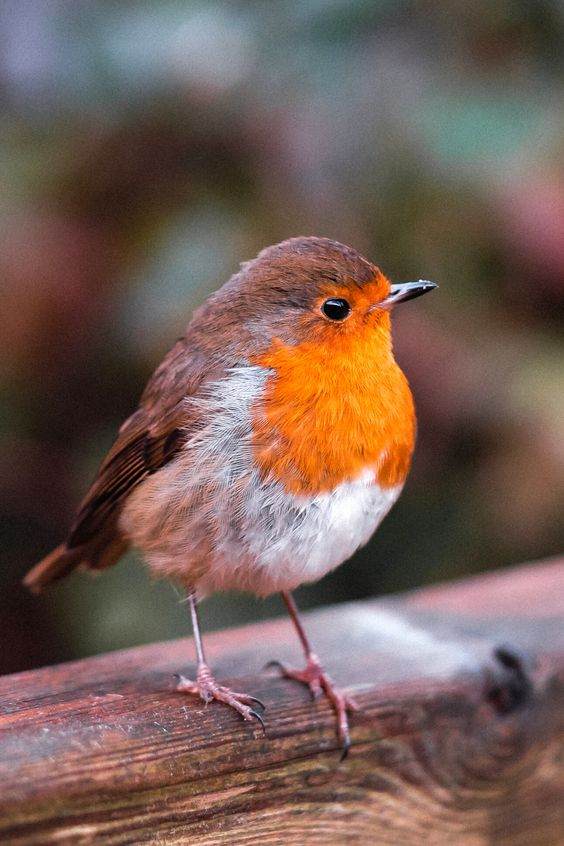

In [10]:
img = Image.open('/content/bird.png')
img

### Detecting edges using Canny Edge  

Dalam teknik ini akan menggunakan algoritma Canny Edge untuk ekstraksi batas/tepian gambar saja. Jadi, alih-alih mengirimkan seluruh detail gambar ke algoritma, saya hanya akan mengirimkan pola tepiannya saja. Saya akan membuat fungsi yang akan menerima gambar ini sebagai parameter dan akan mengembalikan tepinya.

Tidak perlu khawatir rumit karena library OpenCV sendiri memiliki fungsi yang sudah dibuat sebelumnya, jadi hanya perlu memanggilnya untuk mengekstrak tepi objek image.



In [11]:
def canny_edge(img, low_threshold = 100, high_threshold = 200):
  img = np.array(img)

  img = cv2.Canny(img, low_threshold, high_threshold)

  img = img[:, :, None]

  img = np.concatenate([img, img, img], axis = 2)

  canny_img = Image.fromarray(img)

  return canny_img

Mari coba visualisasi hasil pola tepi objek image menggunakan Canny Edges agar lebih terbayang.



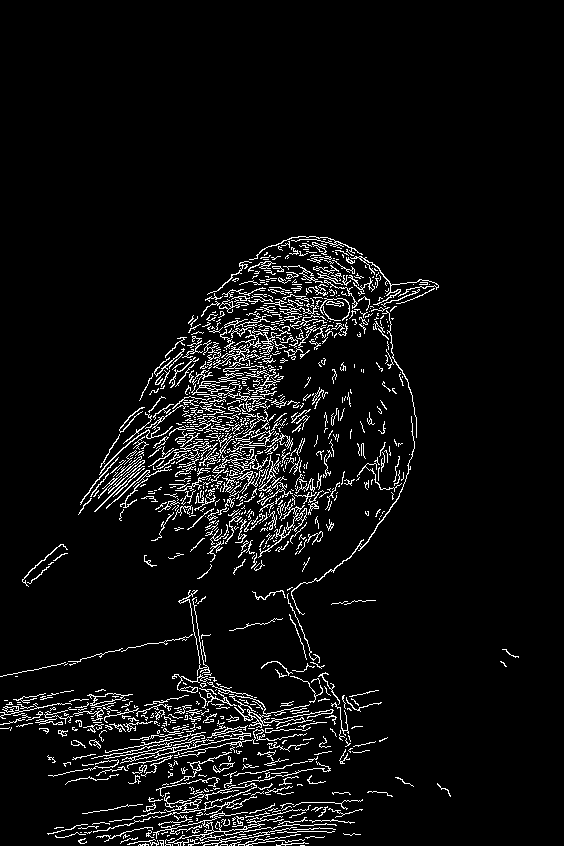

In [12]:
canny_img = canny_edge(img)
canny_img

Nah di tahap ini kita hanya dapat memvisualisasikan tepi yang telah diekstraksi. Selanjutnya algoritma ini akan mampu menghasilkan gambar relevan yang baru sesuai dengan pola tepi yang diidentifikasi.

**Prompting Time**

Selanjutnya coba membuat prompt, jumlah seed untuk reproduktifitas, dan generator. Lalu memanggil pipeline, mengirimkan inputan teks prompt dan tepi gambar sebagai parameter.

In [13]:
prompt = "realistic photo of a bird with cute details, high quality, hyper-realistic"
neg_prompt = ""

seed = 777
generator = torch.Generator(device="cuda").manual_seed(seed)

imgs = pipe(
    prompt,
    canny_img,
    negative_prompt=neg_prompt,
    generator=generator,
    num_inference_steps=20,
)

  0%|          | 0/20 [00:00<?, ?it/s]

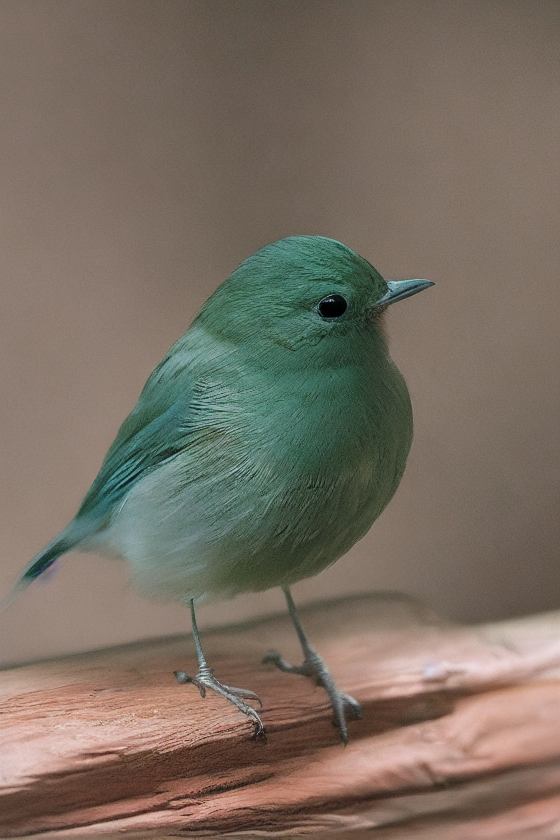

In [14]:
imgs.images[0]

Dapat terlihat gambar berkualitas cukup baik yang merepresentasikan bagian tepinya tadi dan juga sesuai dengan petunjuk prompt yang dikirimkan.

Selanjutnya melakukan pengujian menggunakan prompt yang berbeda dan tambahan prompt negatif yang harus dihindari model dalam generate image.

In [15]:
prompt = ["realistic photo of a bird with casual details, high quality, natural light",
          "realistic photo of a bird in Jakarta during autumn, city in the background",
          "oil painting of a black bird in the desert, realistic, vivid, fantasy, surrealist, best quality, extremely detailed",
          "digital painting of a bird in coffeeshop background, enjoy on bar table"]

neg_prompt = ["blurred, lowres, bad anatomy, ugly, worst quality, low quality, monochrome, signature"] * len(prompt)

seed = 777
generator = torch.Generator(device="cuda").manual_seed(seed)

imgs = pipe(
    prompt,
    canny_img,
    negative_prompt=neg_prompt,
    generator=generator,
    num_inference_steps=20,
)

  0%|          | 0/20 [00:00<?, ?it/s]

<ipython-input-4-592625dd70e9>:18: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((w,h), Image.ANTIALIAS)


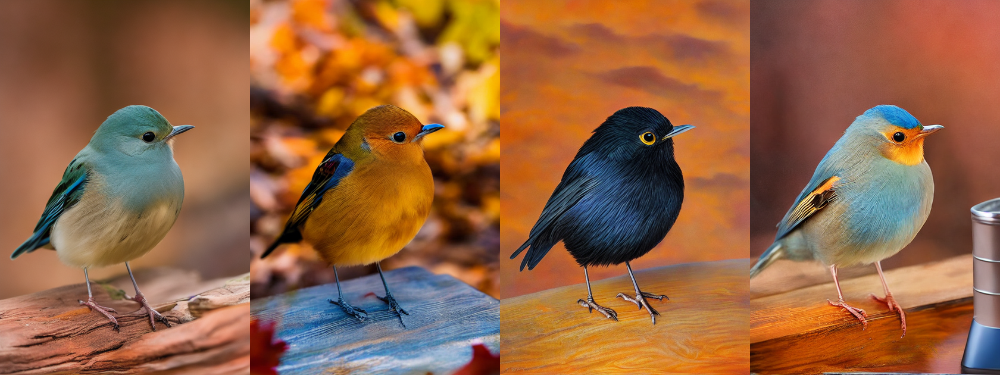

In [16]:
grid_img(imgs.images, 1, len(prompt), scale=0.75)

**Saatnya eksplorasi mencoba gambar lain!**

Sample Image 2: https://drive.google.com/file/d/1ElYY2u-TxaWzGR-Vy9CXLMJT8IxiFZ9g/view?usp=sharing

In [17]:
img = Image.open("/content/kitty-cat-kitten-pet-45201.jpeg")

<ipython-input-4-592625dd70e9>:18: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((w,h), Image.ANTIALIAS)


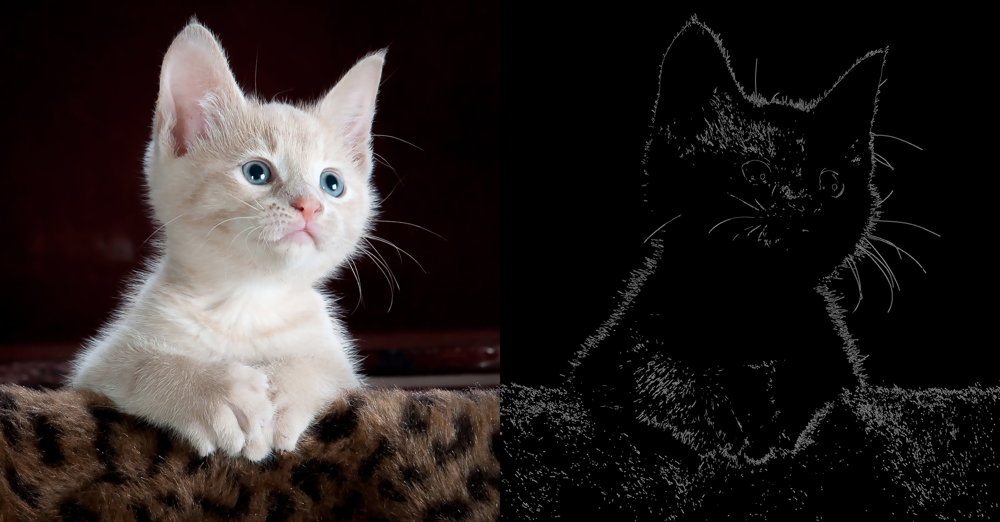

In [18]:
canny_img = canny_edge(img, 200, 255)

grid_img([img, canny_img], 1, 2)

In [ ]:
prompt = ["realistic photo of a cat, high quality, natural light, full moon",
          "realistic photo of a cat in the snow, best quality, extremely detailed",
          "oil painting of cat the desert, canyons in the background, realistic, vivid, fantasy, surrealist, best quality, extremely detailed",
          "watercolor painting of a cat in coffeeshop, yellow tones, mug and jigger in the background"]

neg_prompt = ["blurred, lowres, bad anatomy, ugly, worst quality, low quality, monochrome, signature"] * len(prompt)

seed = 777
generator = torch.Generator(device="cuda").manual_seed(seed)

imgs = pipe(
    prompt,
    canny_img,
    negative_prompt=neg_prompt,
    generator=generator,
    num_inference_steps=20,
)

In [ ]:
grid_img(imgs.images, 1, len(prompt), scale=0.75)